In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import cv2
from keras.models import Sequential
import tqdm.notebook as tq
from keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dropout,MaxPooling2D,Activation, BatchNormalization, Flatten, Dense, Rescaling, Resizing, Input, GlobalAvgPool2D,GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import categorical_crossentropy
import pickle
import matplotlib.pyplot as plt
import random
from tensorflow import keras
from keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import layers, Model
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

In [ ]:
def load_data(datasets, IMAGE_SIZE=(140, 140)):
  class_names = []
  for dataset in datasets:
    images=[]
    labels=[]
    print("tai len {} voi image size: {}".format(dataset, IMAGE_SIZE))
    step=0
    for folder in os.listdir(dataset):
      n=0
      if folder == '.ipynb_checkpoints':
        continue
      print("doc thu muc", str(folder),":")
      for file in tq.tqdm(os.listdir(os.path.join(dataset, folder))):
        img_path=os.path.join(os.path.join(dataset, folder),file)
        if img_path.split('.')[-1] !='jpg':
          continue
        image = cv2.imread(img_path)
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image=cv2.resize(image, IMAGE_SIZE)
        images.append(image)
        labels.append(step)
      step+=1
      class_names.append(str(folder))
    images=np.array(images, dtype='float32')
    labels=np.array(labels, dtype='int32')
  return images, labels, class_names

In [ ]:
images, labels, class_names=load_data(['/content/drive/MyDrive/Data_KLTN_Final'])
print("class names: ",class_names)

tai len /content/drive/MyDrive/Data_KLTN_Final voi image size: (140, 140)
doc thu muc Bảo tàng Chiến dịch Hồ Chí Minh :


  0%|          | 0/227 [00:00<?, ?it/s]

doc thu muc Bưu Điện HCM :


  0%|          | 0/158 [00:00<?, ?it/s]

doc thu muc Bảo Tàng Tranh 3D Art In Us :


  0%|          | 0/254 [00:00<?, ?it/s]

doc thu muc BiTexco :


  0%|          | 0/113 [00:00<?, ?it/s]

doc thu muc Bến Cảng Nhà Rồng :


  0%|          | 0/136 [00:00<?, ?it/s]

doc thu muc Bảo tàng Chứng tích Chiến tranh TPHCM :


  0%|          | 0/302 [00:00<?, ?it/s]

doc thu muc Bảo Tàng Mỹ Thuật TPHCM :


  0%|          | 0/165 [00:00<?, ?it/s]

doc thu muc Bảo tàng Phụ Nữ Nam Bộ :


  0%|          | 0/113 [00:00<?, ?it/s]

doc thu muc Bảo tàng Thành phố Hồ Chí Minh :


  0%|          | 0/168 [00:00<?, ?it/s]

doc thu muc Bảo Tàng Lịch Sử VN TPHCM :


  0%|          | 0/374 [00:00<?, ?it/s]

doc thu muc Chùa Bửu Long :


  0%|          | 0/255 [00:00<?, ?it/s]

doc thu muc Chùa Hoằng Pháp :


  0%|          | 0/298 [00:00<?, ?it/s]

doc thu muc Chùa Pháp Bửu :


  0%|          | 0/297 [00:00<?, ?it/s]

doc thu muc chùa ngọc hoàng :


  0%|          | 0/164 [00:00<?, ?it/s]

doc thu muc Chùa Quốc Tự :


  0%|          | 0/170 [00:00<?, ?it/s]

doc thu muc Chùa Chantarangsay(Chùa Khmer) :


  0%|          | 0/256 [00:00<?, ?it/s]

doc thu muc Bến tàu Bạch Đằng :


  0%|          | 0/187 [00:00<?, ?it/s]

doc thu muc Chùa Huê Nghiêm Q2 :


  0%|          | 0/247 [00:00<?, ?it/s]

doc thu muc Chùa Bà Thiên Hậu Sài Gòn :


  0%|          | 0/338 [00:00<?, ?it/s]

doc thu muc Chợ Đêm Hạnh Thông Tây :


  0%|          | 0/309 [00:00<?, ?it/s]

doc thu muc Chợ Tân Định :


  0%|          | 0/152 [00:00<?, ?it/s]

doc thu muc Chùa Ông Bổn :


  0%|          | 0/186 [00:00<?, ?it/s]

doc thu muc Chợ Lớn (Chợ Bình Tây) :


  0%|          | 0/302 [00:00<?, ?it/s]

doc thu muc Chợ bà chiểu :


  0%|          | 0/106 [00:00<?, ?it/s]

doc thu muc Chùa Ấn Quang :


  0%|          | 0/164 [00:00<?, ?it/s]

doc thu muc Chợ Bến Thành :


  0%|          | 0/358 [00:00<?, ?it/s]

doc thu muc Chợ Kim Biên :


  0%|          | 0/106 [00:00<?, ?it/s]

doc thu muc Công viên giải trí Đầm Sen :


  0%|          | 0/215 [00:00<?, ?it/s]

doc thu muc Chùa Vạn Đức :


  0%|          | 0/211 [00:00<?, ?it/s]

doc thu muc công viên Vinhomes Central Park :


  0%|          | 0/304 [00:00<?, ?it/s]

doc thu muc Công Viên Suối Tiên :


  0%|          | 0/108 [00:00<?, ?it/s]

doc thu muc Dinh Độc Lập :


  0%|          | 0/112 [00:00<?, ?it/s]

doc thu muc công viên thỏ trắng :


  0%|          | 0/111 [00:00<?, ?it/s]

doc thu muc Hồ Con Rùa TPHCM :


  0%|          | 0/237 [00:00<?, ?it/s]

doc thu muc Landmark 81 :


  0%|          | 0/105 [00:00<?, ?it/s]

doc thu muc Cầu Ánh Sao Sài Gòn :


  0%|          | 0/150 [00:00<?, ?it/s]

doc thu muc Hẻm Bia Lost in HongKong :


  0%|          | 0/144 [00:00<?, ?it/s]

doc thu muc Pháp Viện Minh Đăng Quang :


  0%|          | 0/185 [00:00<?, ?it/s]

doc thu muc nhà thờ hạnh thông tây :


  0%|          | 0/131 [00:00<?, ?it/s]

doc thu muc Phù Châu Miếu (Miếu Nổi) :


  0%|          | 0/160 [00:00<?, ?it/s]

doc thu muc Nhà Thờ Tân Định :


  0%|          | 0/220 [00:00<?, ?it/s]

doc thu muc Nhà Thờ Cha Tam :


  0%|          | 0/192 [00:00<?, ?it/s]

doc thu muc Nowzone Fashion Mall Shopping Center :


  0%|          | 0/60 [00:00<?, ?it/s]

doc thu muc Nhà thờ Huyện Sĩ :


  0%|          | 0/249 [00:00<?, ?it/s]

doc thu muc Nhà thờ Chợ Quán :


  0%|          | 0/246 [00:00<?, ?it/s]

doc thu muc Nhà Thờ Đức Bà :


  0%|          | 0/205 [00:00<?, ?it/s]

doc thu muc Nhà Hát TPHCM :


  0%|          | 0/112 [00:00<?, ?it/s]

doc thu muc Đền Mariamman :


  0%|          | 0/110 [00:00<?, ?it/s]

doc thu muc Thảo Cầm Viên SG :


  0%|          | 0/246 [00:00<?, ?it/s]

doc thu muc Phố Tây Bùi Viện TPHCM :


  0%|          | 0/102 [00:00<?, ?it/s]

doc thu muc Đài tưởng niệm Bồ tát Thích Quảng Đức :


  0%|          | 0/129 [00:00<?, ?it/s]

doc thu muc Tu Viện Khánh An :


  0%|          | 0/245 [00:00<?, ?it/s]

doc thu muc Đền Tưởng Niệm Bến Dược :


  0%|          | 0/264 [00:00<?, ?it/s]

doc thu muc Địa đạo Củ Chi :


  0%|          | 0/338 [00:00<?, ?it/s]

doc thu muc Công viên đá Nhật Rinrin Park :


  0%|          | 0/467 [00:00<?, ?it/s]

doc thu muc Đường sách Nguyên Văn Bình :


  0%|          | 0/432 [00:00<?, ?it/s]

doc thu muc Áo Dài Exhibition :


  0%|          | 0/418 [00:00<?, ?it/s]

doc thu muc Tu Viện VĨNH NGHIÊM :


  0%|          | 0/417 [00:00<?, ?it/s]

doc thu muc Chùa Một Cột Thủ Đức :


  0%|          | 0/413 [00:00<?, ?it/s]

doc thu muc Phố Đi Bộ Nguyễn Huệ :


  0%|          | 0/408 [00:00<?, ?it/s]

class names:  ['Bảo tàng Chiến dịch Hồ Chí Minh', 'Bưu Điện HCM', 'Bảo Tàng Tranh 3D Art In Us', 'BiTexco', 'Bến Cảng Nhà Rồng', 'Bảo tàng Chứng tích Chiến tranh TPHCM', 'Bảo Tàng Mỹ Thuật TPHCM', 'Bảo tàng Phụ Nữ Nam Bộ', 'Bảo tàng Thành phố Hồ Chí Minh', 'Bảo Tàng Lịch Sử VN TPHCM', 'Chùa Bửu Long', 'Chùa Hoằng Pháp', 'Chùa Pháp Bửu', 'chùa ngọc hoàng', 'Chùa Quốc Tự', 'Chùa Chantarangsay(Chùa Khmer)', 'Bến tàu Bạch Đằng', 'Chùa Huê Nghiêm Q2', 'Chùa Bà Thiên Hậu Sài Gòn', 'Chợ Đêm Hạnh Thông Tây', 'Chợ Tân Định', 'Chùa Ông Bổn', 'Chợ Lớn (Chợ Bình Tây)', 'Chợ bà chiểu', 'Chùa Ấn Quang', 'Chợ Bến Thành', 'Chợ Kim Biên', 'Công viên giải trí Đầm Sen', 'Chùa Vạn Đức', 'công viên Vinhomes Central Park', 'Công Viên Suối Tiên', 'Dinh Độc Lập', 'công viên thỏ trắng', 'Hồ Con Rùa TPHCM', 'Landmark 81', 'Cầu Ánh Sao Sài Gòn', 'Hẻm Bia

In [ ]:
class_names = class_names = ['Bảo tàng Chiến dịch Hồ Chí Minh', 'Bưu Điện HCM', 'Bảo Tàng Tranh 3D Art In Us', 'BiTexco', 'Bến Cảng Nhà Rồng', 'Bảo tàng Chứng tích Chiến tranh TPHCM', 'Bảo Tàng Mỹ Thuật TPHCM', 'Bảo tàng Phụ Nữ Nam Bộ', 'Bảo tàng Thành phố Hồ Chí Minh', 'Bảo Tàng Lịch Sử VN TPHCM', 'Chùa Bửu Long', 'Chùa Hoằng Pháp', 'Chùa Pháp Bửu', 'chùa ngọc hoàng', 'Chùa Quốc Tự', 'Chùa Chantarangsay(Chùa Khmer)', 'Bến tàu Bạch Đằng', 'Chùa Huê Nghiêm Q2', 'Chùa Bà Thiên Hậu Sài Gòn', 'Chợ Đêm Hạnh Thông Tây', 'Chợ Tân Định', 'Chùa Ông Bổn', 'Chợ Lớn (Chợ Bình Tây)', 'Chợ bà chiểu', 'Chùa Ấn Quang', 'Chợ Bến Thành', 'Chợ Kim Biên', 'Công viên giải trí Đầm Sen', 'Chùa Vạn Đức', 'công viên Vinhomes Central Park', 'Công Viên Suối Tiên', 'Dinh Độc Lập', 'công viên thỏ trắng', 'Hồ Con Rùa TPHCM', 'Landmark 81', 'Cầu Ánh Sao Sài Gòn', 'Hẻm Bia Lost in HongKong', 'Pháp Viện Minh Đăng Quang', 'nhà thờ hạnh thông tây', 'Phù Châu Miếu (Miếu Nổi)', 'Nhà Thờ Tân Định', 'Nhà Thờ Cha Tam', 'Nowzone Fashion Mall Shopping Center', 'Nhà thờ Huyện Sĩ', 'Nhà thờ Chợ Quán', 'Nhà Thờ Đức Bà', 'Nhà Hát TPHCM', 'Đền Mariamman', 'Thảo Cầm Viên SG', 'Phố Tây Bùi Viện TPHCM', 'Đài tưởng niệm Bồ tát Thích Quảng Đức', 'Tu Viện Khánh An', 'Đền Tưởng Niệm Bến Dược', 'Địa đạo Củ Chi', 'Công viên đá Nhật Rinrin Park', 'Đường sách Nguyên Văn Bình', 'Áo Dài Exhibition', 'Tu Viện VĨNH NGHIÊM', 'Chùa Một Cột Thủ Đức', 'Phố Đi Bộ Nguyễn Huệ']
with open('/content/drive/MyDrive/Data_HoanChinh_KLTN/data_Agu_KLTN.pkl', 'rb') as f:
  images, labels = pickle.load(f)

In [ ]:
len(class_names)

60

In [ ]:
len(images)

14846

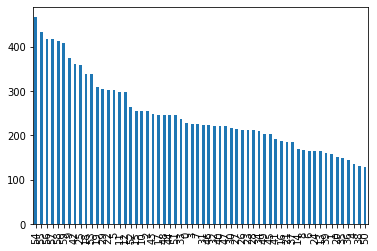

In [ ]:
pd.Series(labels).value_counts().plot.bar()

In [ ]:
from keras.utils.np_utils import to_categorical
labels=to_categorical(labels, num_classes=len(class_names))
images=images/255.0

In [ ]:
train_images, test_images, train_labels, test_labels = train_test_split(images, labels,  test_size = 0.1, random_state=42)
train_images, val_images, train_labels, val_labels = train_test_split(train_images, train_labels, test_size = 0.1, random_state=42)

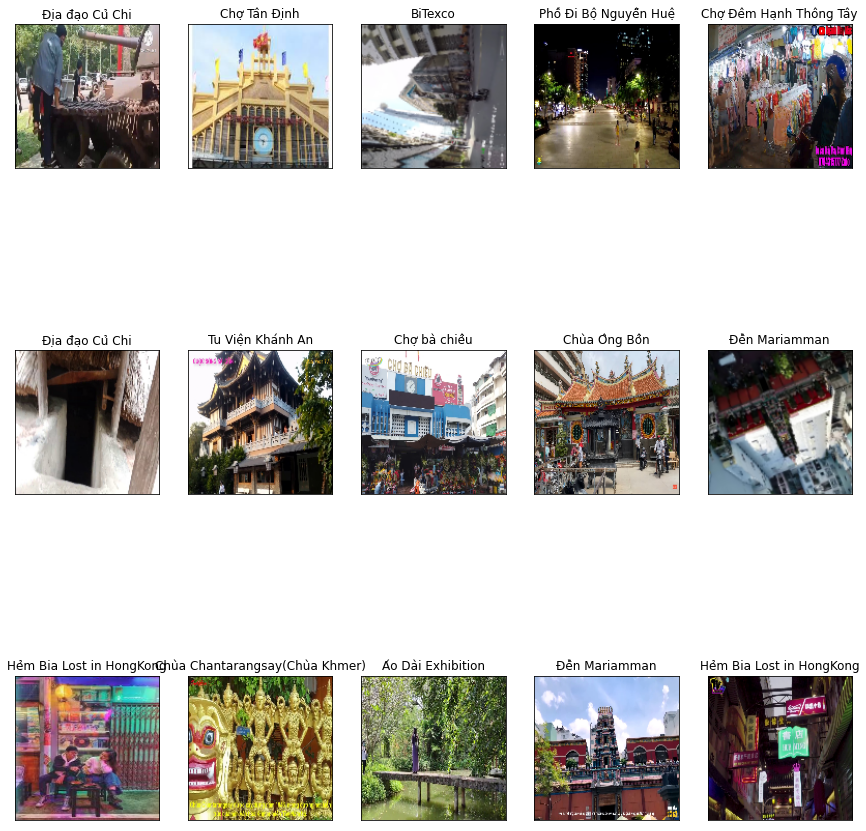

In [ ]:
import matplotlib.pyplot as plt
fig, axes=plt.subplots(3,5,figsize=(15,17))
for i,ax in enumerate(axes.flat):
  i+=100
  img=train_images[i]
  label=class_names[np.argmax(train_labels[i])]
  ax.set_title(str(label))
  ax.imshow(img, cmap='gray')
  ax.set_xticks([])
  ax.set_yticks([])

In [ ]:
print("class names: ",class_names)
print("Kích thước tập train: ",len(train_images), "ảnh")
print("Kích thước tập test: ",len(test_images), "ảnh")
print("Kích thước tập validation: ",len(val_images), "ảnh")
print("Kích thước tập train: ",train_images.shape)
print("Kích thước tập test: ",test_images.shape)
print("Kích thước tập validation: ",val_images.shape)
print("Kích thước tập train label: ",train_labels.shape)
print("Kích thước tập test label: ",test_labels.shape)
print("Kích thước tập validation label: ",val_labels.shape)

class names:  ['Bảo tàng Chiến dịch Hồ Chí Minh', 'Bưu Điện HCM', 'Bảo Tàng Tranh 3D Art In Us', 'BiTexco', 'Bến Cảng Nhà Rồng', 'Bảo tàng Chứng tích Chiến tranh TPHCM', 'Bảo Tàng Mỹ Thuật TPHCM', 'Bảo tàng Phụ Nữ Nam Bộ', 'Bảo tàng Thành phố Hồ Chí Minh', 'Bảo Tàng Lịch Sử VN TPHCM', 'Chùa Bửu Long', 'Chùa Hoằng Pháp', 'Chùa Pháp Bửu', 'chùa ngọc hoàng', 'Chùa Quốc Tự', 'Chùa Chantarangsay(Chùa Khmer)', 'Bến tàu Bạch Đằng', 'Chùa Huê Nghiêm Q2', 'Chùa Bà Thiên Hậu Sài Gòn', 'Chợ Đêm Hạnh Thông Tây', 'Chợ Tân Định', 'Chùa Ông Bổn', 'Chợ Lớn (Chợ Bình Tây)', 'Chợ bà chiểu', 'Chùa Ấn Quang', 'Chợ Bến Thành', 'Chợ Kim Biên', 'Công viên giải trí Đầm Sen', 'Chùa Vạn Đức', 'công viên Vinhomes Central Park', 'Công Viên Suối Tiên', 'Dinh Độc Lập', 'công viên thỏ trắng', 'Hồ Con Rùa TPHCM', 'Landmark 81', 'Cầu Ánh Sao Sài Gòn', 'Hẻm Bia

In [ ]:
def ve_Acc_Loss(history):

  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.xlabel('epoch')
  plt.ylabel('Loss')
  plt.legend(['loss','val_loss'])
  plt.show()

  plt.plot(history.history['acc'])
  plt.plot(history.history['val_acc'])
  plt.xlabel('epoch')
  plt.ylabel('accuracy')
  plt.legend(['accuracy','val_accuracy'])
  plt.show()

# **Resnet50**

In [ ]:
from keras.applications.resnet import ResNet50

base_model = ResNet50(input_shape=(140, 140,3), include_top=False, weights="imagenet")
for layer in base_model.layers[:]:
  layer.trainable = True
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x) 
x = Dense(len(class_names), activation='softmax')(x) 
finetune_restNet50 = Model(inputs=base_model.input, outputs=x)
M4 = finetune_restNet50.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["acc"])
finetune_restNet50.optimizer.learning_rate = 0.0001



In [ ]:
finetune_restNet50.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 140, 140, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 146, 146, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 70, 70, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 70, 70, 64)   256         ['conv1_conv[0][0]']         

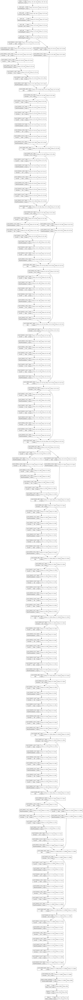

In [ ]:
# import tensoflow as tf

tf.keras.utils.plot_model(finetune_restNet50,show_shapes=True, show_layer_activations=True)

In [ ]:

model_restNet50= finetune_restNet50.fit(train_images,train_labels, validation_data=(val_images, val_labels), batch_size=64, epochs=100)

Epoch 1/100
188/188 [==============================] - 153s 693ms/step - loss: 3.0802 - acc: 0.2747 - val_loss: 7.4206 - val_acc: 0.0180
Epoch 2/100
188/188 [==============================] - 124s 662ms/step - loss: 1.1785 - acc: 0.7082 - val_loss: 6.8170 - val_acc: 0.0180
Epoch 3/100
188/188 [==============================] - 124s 661ms/step - loss: 0.4425 - acc: 0.8906 - val_loss: 5.4741 - val_acc: 0.0322
Epoch 4/100
188/188 [==============================] - 124s 661ms/step - loss: 0.1729 - acc: 0.9578 - val_loss: 3.5869 - val_acc: 0.2147
Epoch 5/100
188/188 [==============================] - 124s 662ms/step - loss: 0.0841 - acc: 0.9803 - val_loss: 1.6723 - val_acc: 0.6283
Epoch 6/100
188/188 [==============================] - 125s 663ms/step - loss: 0.0636 - acc: 0.9842 - val_loss: 0.8241 - val_acc: 0.8212
Epoch 7/100
188/188 [==============================] - 124s 662ms/step - loss: 0.0601 - acc: 0.9867 - val_loss: 0.7493 - val_acc: 0.8242
Epoch 8/100
188/188 [====================

In [ ]:
model_restNet50=models.load('')

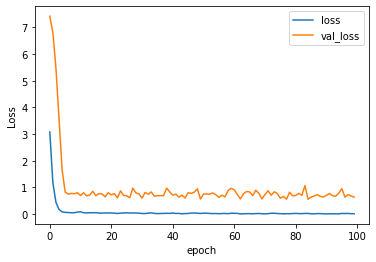

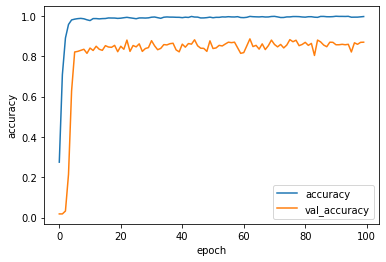

In [ ]:
ve_Acc_Loss(model_restNet50)

In [ ]:
finetune_restNet50.save('/content/drive/MyDrive/Model/ResNet50_KLTN.h5')

In [ ]:
y_pred = finetune_restNet50.predict(test_images)
y_classes = [np.argmax(element) for element in y_pred]


In [ ]:
img = cv2.imread('/content/Tu Viện Vĩnh Nghiêm.jpg')
img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
img = cv2.resize(img, (140, 140))
img = np.array([img])
pred = finetune_restNet50.predict(img)
pred_classes = [np.argmax(element) for element in pred]
class_names[pred_classes[0]]


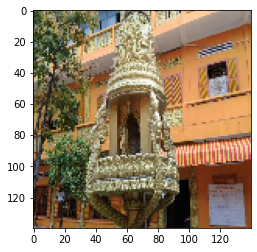

Chùa Chantarangsay(Chùa Khmer)


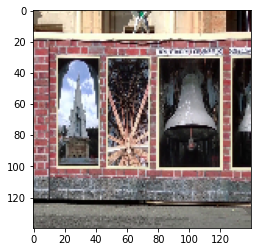

Nhà Thờ Đức Bà


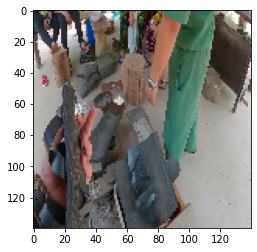

Bảo tàng Chiến dịch Hồ Chí Minh


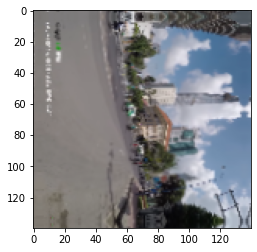

BiTexco


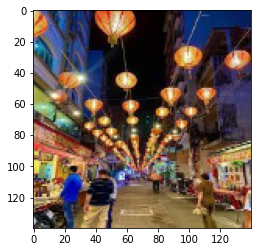

Hẻm Bia Lost in HongKong


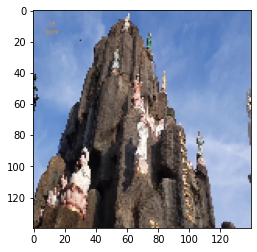

Chùa Pháp Bửu


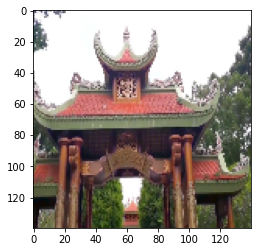

Đền Tưởng Niệm Bến Dược


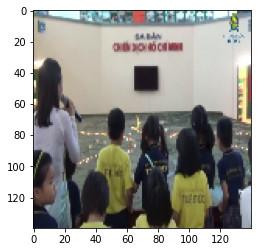

Bảo tàng Chiến dịch Hồ Chí Minh


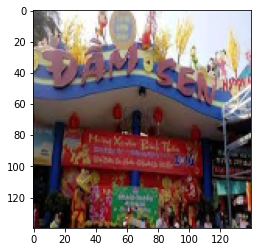

Công viên giải trí Đầm Sen


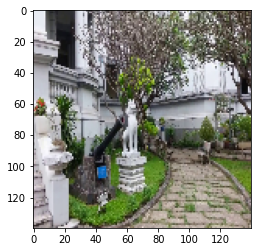

Bảo tàng Thành phố Hồ Chí Minh


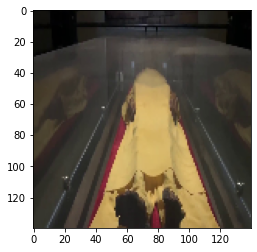

Bảo tàng Chứng tích Chiến tranh TPHCM


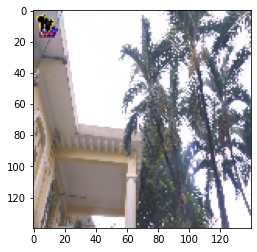

Bảo tàng Phụ Nữ Nam Bộ


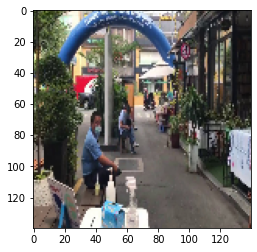

Đường sách Nguyên Văn Bình


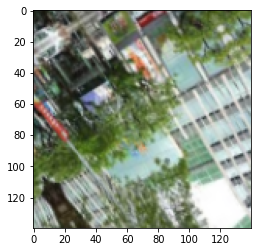

Nowzone Fashion Mall Shopping Center


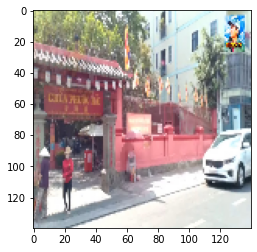

chùa ngọc hoàng


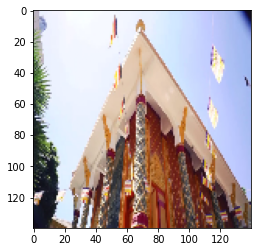

Chợ Lớn (Chợ Bình Tây)


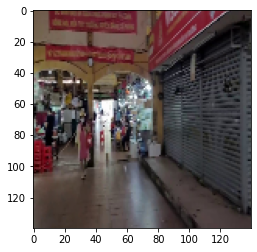

Chợ Bến Thành


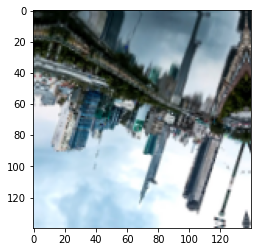

Nowzone Fashion Mall Shopping Center


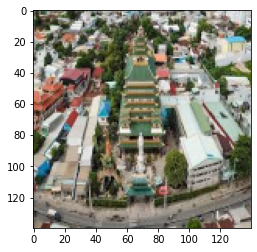

Chùa Vạn Đức


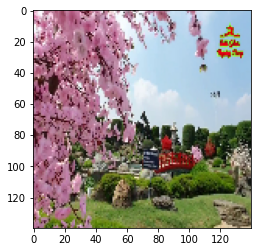

Công viên đá Nhật Rinrin Park


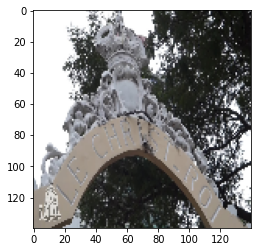

Nhà thờ Huyện Sĩ


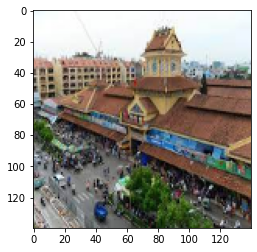

Chợ Lớn (Chợ Bình Tây)


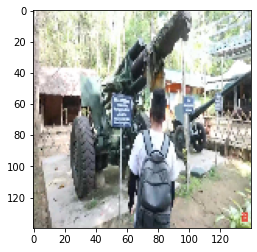

Đường sách Nguyên Văn Bình


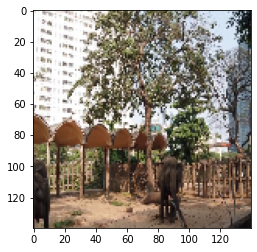

Thảo Cầm Viên SG


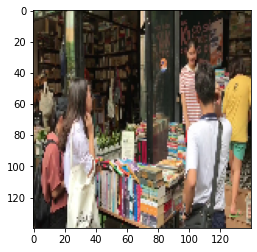

Đường sách Nguyên Văn Bình


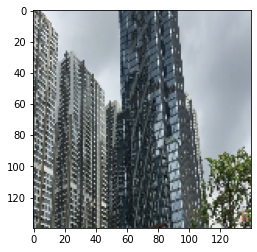

Landmark 81


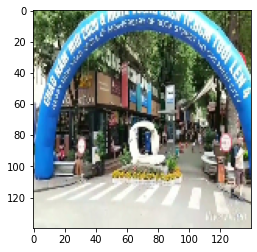

công viên thỏ trắng


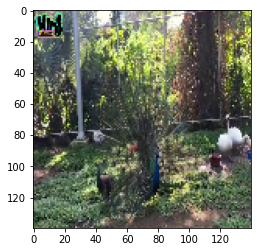

Thảo Cầm Viên SG


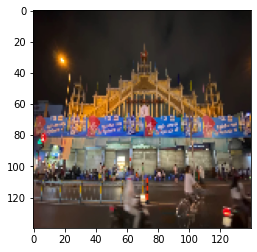

Chợ Tân Định


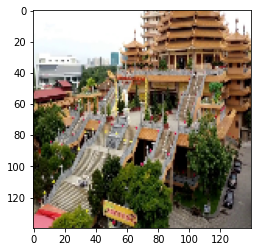

Pháp Viện Minh Đăng Quang


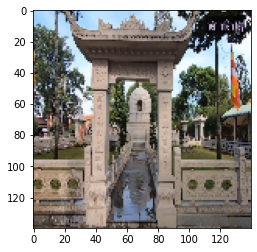

Chùa Một Cột Thủ Đức


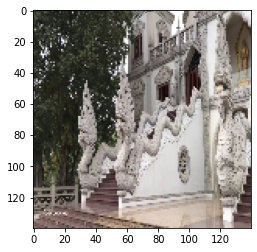

Chùa Bửu Long


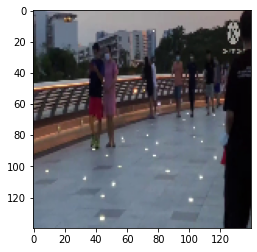

Cầu Ánh Sao Sài Gòn


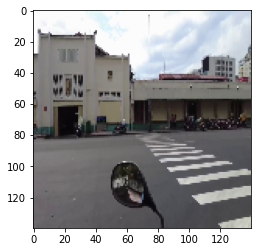

Chợ Bến Thành


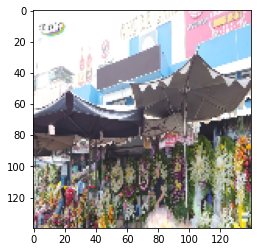

Chợ bà chiểu


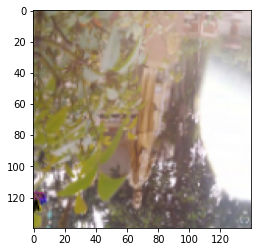

Bảo tàng Phụ Nữ Nam Bộ


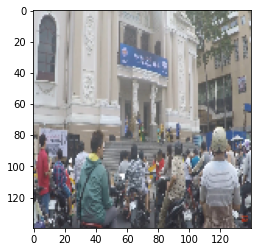

Nhà Hát TPHCM


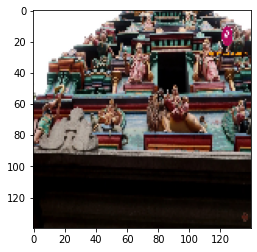

Đền Mariamman


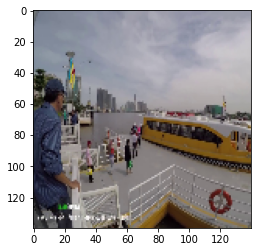

Bến tàu Bạch Đằng


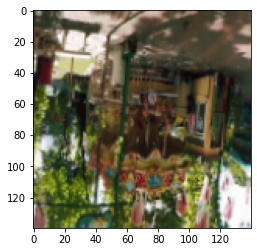

Bảo tàng Phụ Nữ Nam Bộ


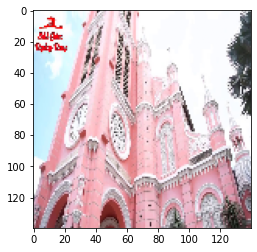

Nhà Thờ Tân Định


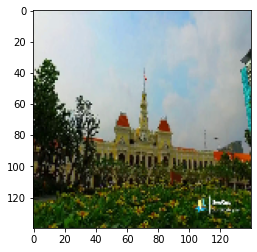

Phố Đi Bộ Nguyễn Huệ


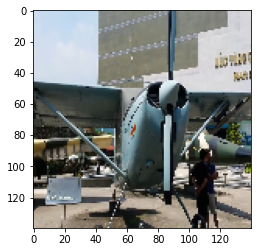

Bảo tàng Chứng tích Chiến tranh TPHCM


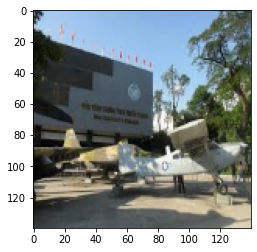

Bảo tàng Chứng tích Chiến tranh TPHCM


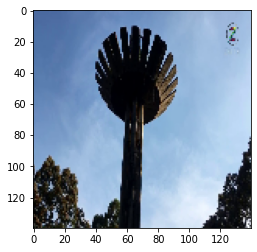

Hồ Con Rùa TPHCM


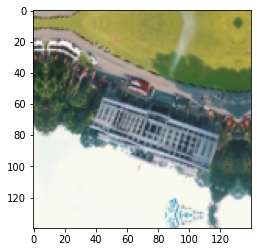

Dinh Độc Lập


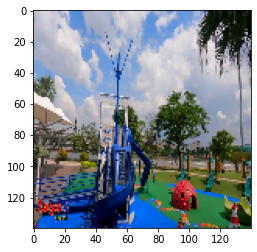

công viên Vinhomes Central Park


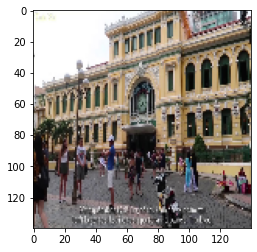

Bưu Điện HCM


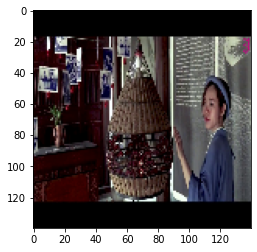

Áo Dài Exhibition


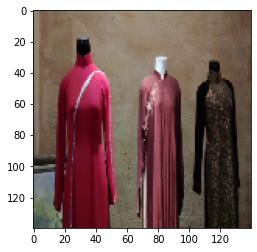

Áo Dài Exhibition


In [ ]:
predictions = finetune_restNet50.predict(test_images[:50])
for i in range(0, 50):
    prediction = [np.argmax(element) for element in pred]
    label = class_names[y_classes[i]]
    plt.imshow(test_images[i])
    plt.show()
    print(label)

In [ ]:
from keras import models
finetune_restNet50=models.load_model('/content/drive/MyDrive/Model/ResNet50_KLTN.h5')

In [ ]:
y_hat = finetune_restNet50.predict(test_images)
y_pred = np.argmax(y_hat, axis=1)
y_test_label =  np.argmax(test_labels, axis=1)


# Tính accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(y_test_label, y_pred)
print('Accuracy: %f' % accuracy)
# Tính precision tp / (tp + fp)
precision = precision_score(y_test_label, y_pred, average='macro')
print('Precision: %f' % precision)
# Tính recall: tp / (tp + fn)
recall = recall_score(y_test_label, y_pred, average='macro')
print('Recall: %f' % recall)
# Tính f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test_label, y_pred, average='macro')
print('F1 score: %f' % f1)
# Tính Area under ROC
auc = roc_auc_score(test_labels, y_hat, multi_class='ovr')
print('ROC AUC: %f' % auc)
# Tính confusion matrix
matrix = confusion_matrix(y_test_label, y_pred)
print(matrix)

Accuracy: 0.845118
Precision: 0.861776
Recall: 0.843640
F1 score: 0.844100
ROC AUC: 0.992365
[[18  0  0 ...  0  0  0]
 [ 1 18  0 ...  0  0  0]
 [ 0  0 28 ...  0  0  0]
 ...
 [ 0  0  0 ... 36  0  0]
 [ 0  0  0 ...  0 23  0]
 [ 0  0  0 ...  0  0 33]]


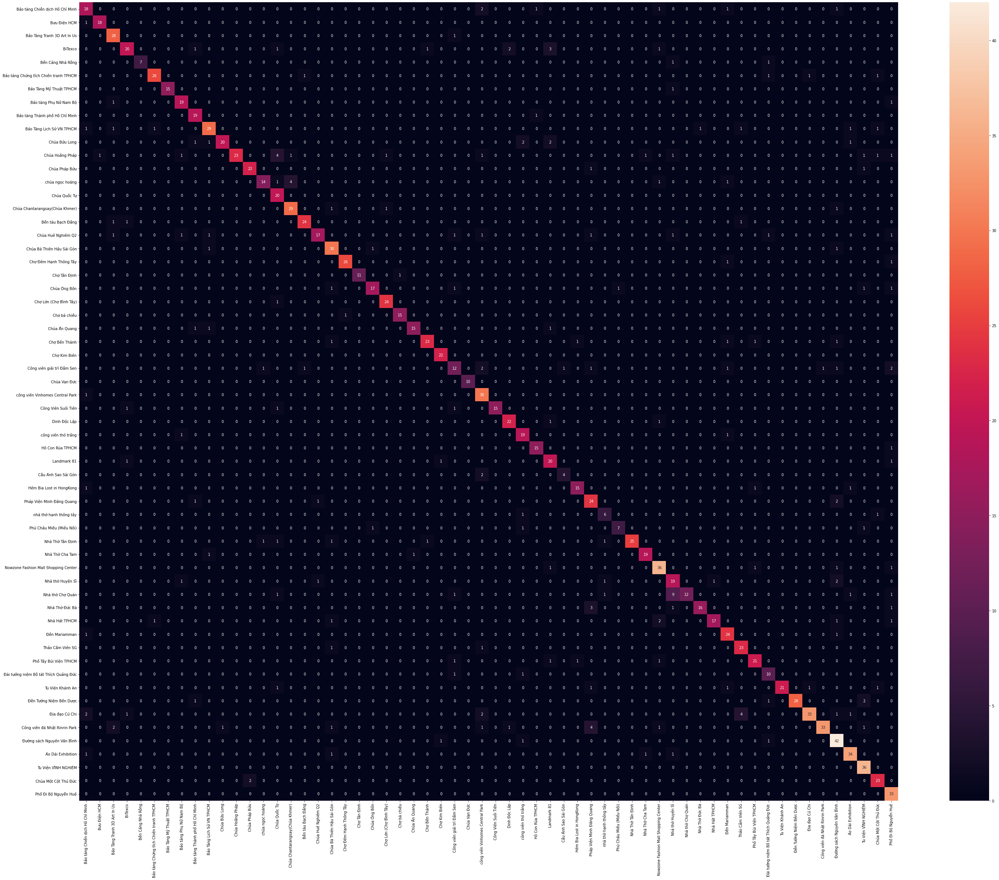

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib
import matplotlib.pyplot as plt
df_cm = pd.DataFrame(matrix, index = [i for i in  class_names],
                  columns = [i for i in class_names])
plt.figure(figsize = (50,40))
sn.heatmap(df_cm, annot=True)